# Sound Event Classification

## Requirements

In [39]:
%pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.


## Libraries

In [66]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import librosa
import sklearn
import tensorflow as tf
import IPython
import tqdm
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping, ModelCheckpoint
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
plt.style.use("seaborn-v0_8")

from audiomentations import AddGaussianSNR, PitchShift, TimeStretch, ApplyImpulseResponse
from pedalboard import Pedalboard, Compressor


## Dataset

Required [ESC-50 Dataset](https://github.com/karolpiczak/ESC-50/archive/master.zip)

### Loading of the dataset of the metadata and dataset analysis

In [41]:
fn_csv = 'ESC-50-master/meta/esc50.csv'

ds_files = []  # File list
ds_labels = []  # Class list

ds = pd.read_csv(fn_csv)
ds.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [42]:
#unique class labels
unique_classes = ds['category'].unique()
print("Unique classes:", unique_classes)

# Check the number of unique class labels
print("Count:", len(unique_classes))

# Filling the lists with filenames and labels
ds_files = ds['filename'].values
pure_ds_labels = ds['category'].values

Unique classes: ['dog' 'chirping_birds' 'vacuum_cleaner' 'thunderstorm' 'door_wood_knock'
 'can_opening' 'crow' 'clapping' 'fireworks' 'chainsaw' 'airplane'
 'mouse_click' 'pouring_water' 'train' 'sheep' 'water_drops'
 'church_bells' 'clock_alarm' 'keyboard_typing' 'wind' 'footsteps' 'frog'
 'cow' 'brushing_teeth' 'car_horn' 'crackling_fire' 'helicopter'
 'drinking_sipping' 'rain' 'insects' 'laughing' 'hen' 'engine' 'breathing'
 'crying_baby' 'hand_saw' 'coughing' 'glass_breaking' 'snoring'
 'toilet_flush' 'pig' 'washing_machine' 'clock_tick' 'sneezing' 'rooster'
 'sea_waves' 'siren' 'cat' 'door_wood_creaks' 'crickets']
Count: 50


Check whether Ydata is balanced or not by plotting the histogram.

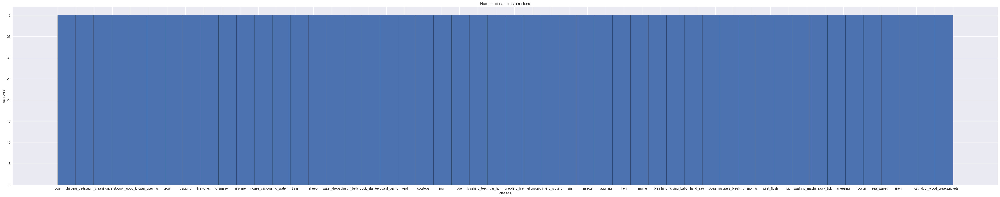

In [44]:
plt.figure(figsize=(55, 10))
plt.title("Number of samples per class")
plt.hist(np.asarray(pure_ds_labels), bins=50, edgecolor='black') 
plt.xlabel("classes")
plt.ylabel("samples")
plt.show()

Transient sound:


Continous sound:


Intermittent sound:


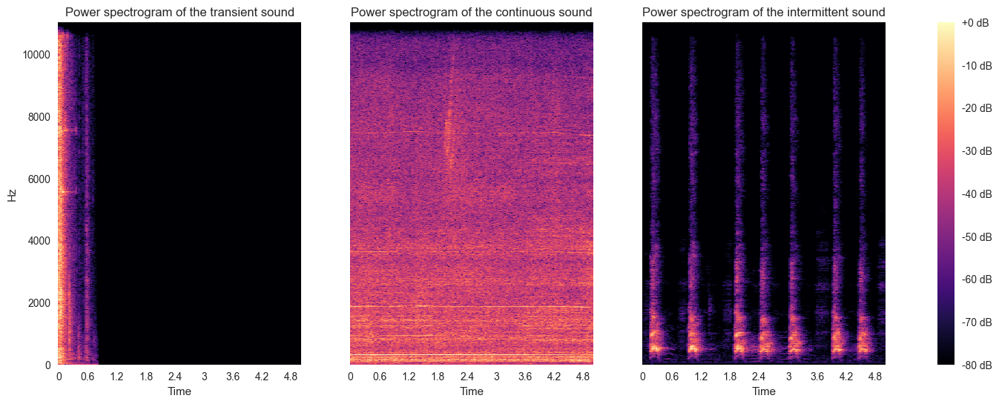

In [46]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-84705-A-39.wav'  # Transient
file1 = path + '1-19872-A-36.wav'  # Continuous
file2 = path + '1-30344-A-0.wav'   # Intermittent

name = ['transient', 'continuous', 'intermittent']

# Show audio player for each file
print('Transient sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Continous sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Intermittent sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Fra quelli simili si fa confusione: se vuelve loco

Washing machine sound:


Helicopter sound:


Engine sound:


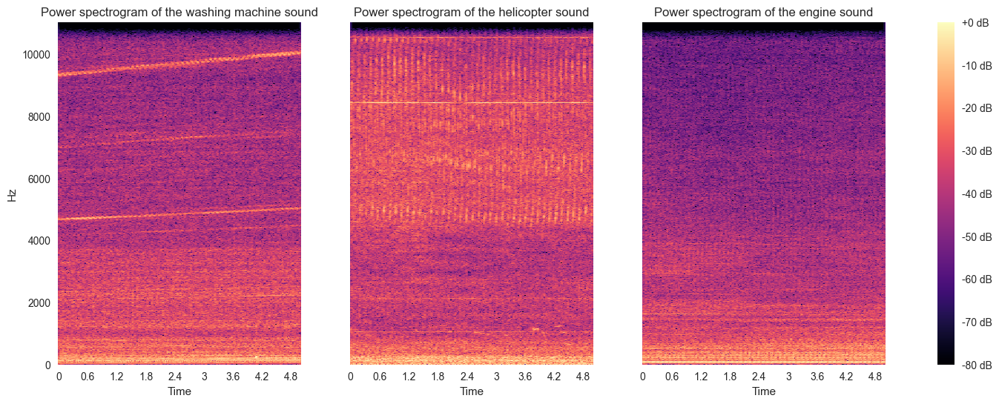

In [47]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-23996-B-35.wav'     # La Lavadora
file1 = path + '1-172649-A-40.wav'    # El helicoptero
file2 = path + '5-232272-A-44.wav'    # El coche


name = ['washing machine', 'helicopter', 'engine']

# Show audio player for each file
print('Washing machine sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Helicopter sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Engine sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Se vogliamo mettere come c'è un'alta variabilità nella stessa classe. Vogliamo l'abbaio 

First dog sound:


Second dog sound:


Third dog sound:


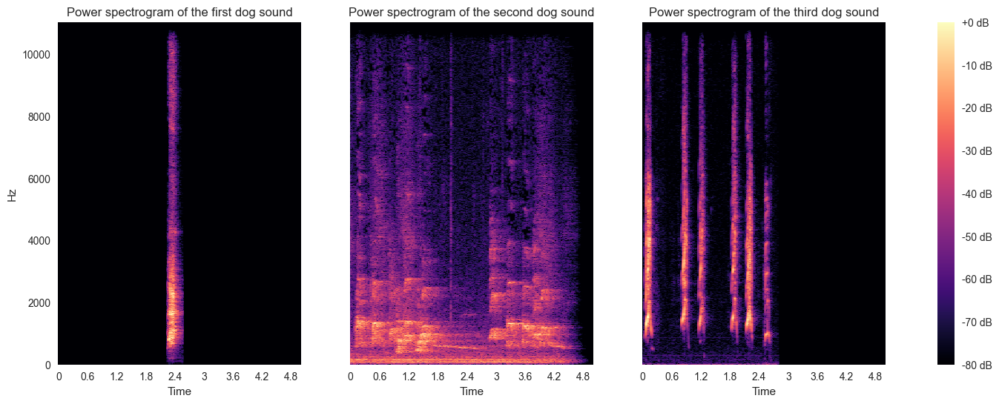

In [48]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-100032-A-0.wav'     # El perro limpio
file1 = path + '3-136288-A-0.wav'     # El perro en la lavadora
file2 = path + '5-9032-A-0.wav'       # El perro sucio

name = ['first dog', 'second dog', 'third dog']

# Show audio player for each file
print('First dog sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Second dog sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Third dog sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Un'altra cosa da far notare è che non esiste una vera conoscenza e struttura di suoni ambientali ('o ritmo, o suono, 'o mare). Harmonic percussion

Harmonic component


Percussive component


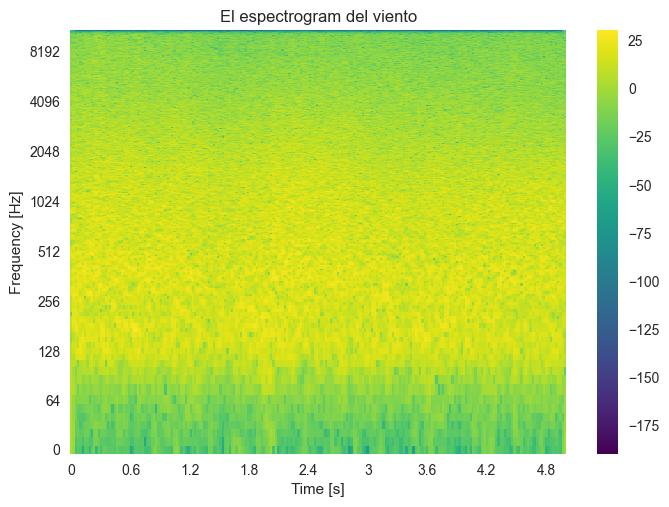

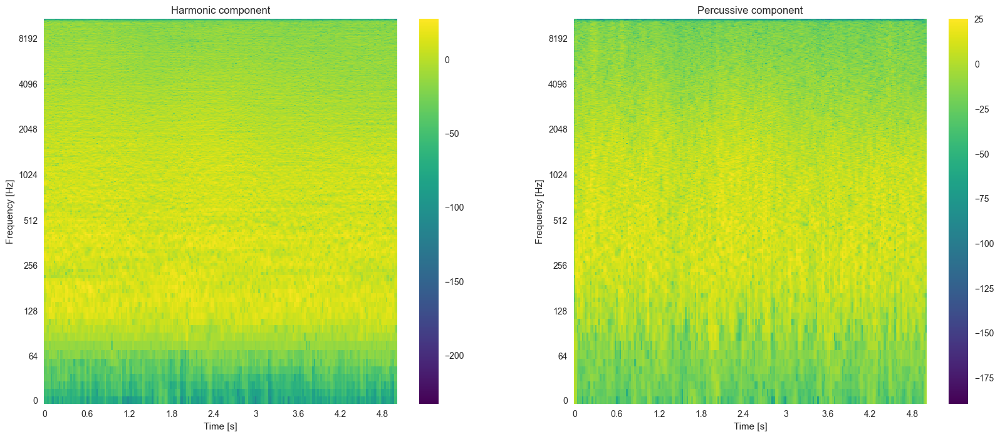

In [49]:
path = 'ESC-50-master/audio/'
file0 = path + '1-51037-A-16.wav'     # El viento

sound, sr = librosa.load(file0)

S = librosa.stft(sound)

librosa.display.specshow(20*np.log10(np.abs(S)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'El espectrogram del viento')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

Hmm, Prs = librosa.decompose.hpss(S)

plt.figure(figsize=(20,8))

plt.subplot(1, 2, 1)
librosa.display.specshow(20*np.log10(np.abs(Hmm)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Harmonic component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

plt.subplot(1, 2, 2)
librosa.display.specshow(20*np.log10(np.abs(Prs)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Percussive component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

print(f'Harmonic component')
IPython.display.display(IPython.display.Audio(librosa.istft(Hmm), rate=sr))
print(f'Percussive component')
IPython.display.display(IPython.display.Audio(librosa.istft(Prs), rate=sr))

# Pre-processing

Required [MIT Acoustical Reverberation Scene Statistics Survey](https://mcdermottlab.mit.edu/Reverb/IRMAudio/Audio.zip)

We decided to use audiomentations instead of the PyTorch one in order to have compressors.
-	Add different background noises with different SNRs
-	Pitch shifting
-	Time stretching
-	Dynamic range compression
-	Convolution with impulse responses

Background noise

In [50]:
def addGaussianNoise(signal, sr, min_snr_db, max_snr_db, activation_prob):
    """
    Adds Gaussian noise to the audio signal with a specified SNR range and activation probability.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_snr_db (float): Minimum SNR in dB.
        max_snr_db (float): Maximum SNR in dB.
        activation_prob (float): Probability of applying the augmentation.
    Returns:
        np.ndarray: The augmented audio signal with Gaussian noise added.
    """
    
    transform = AddGaussianSNR(
        min_snr_db=min_snr_db,
        max_snr_db=max_snr_db,
        p=activation_prob
    )
    augmented_signal = transform(samples=signal, sample_rate=sr)
    return augmented_signal

Pitch Shifting

In [51]:
def pitchShifter(signal, sr, min_semitones, max_semitones, activation_prob):
    """
    Shifts the pitch of the audio signal by a random number of semitones within a specified range.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_semitones (int): Minimum number of semitones to shift.
        max_semitones (int): Maximum number of semitones to shift.
        activation_prob (float): Probability of applying the augmentation.
    Returns:
        np.ndarray: The augmented audio signal with pitch shifted.
    """
    
    transform = PitchShift(
        min_semitones=min_semitones,
        max_semitones=max_semitones,
        p=activation_prob
    )
    augmented_signal = transform(samples=signal, sample_rate=sr)
    return augmented_signal

Time Stretching 

In [52]:
def timeStretcher(signal, sr, min_rate, max_rate, activation_prob, leave_length_unchanged=True):
    """
    Stretches or compresses the audio signal in time by a random factor within a specified range.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_rate (float): Minimum stretch/compression rate.
        max_rate (float): Maximum stretch/compression rate.
        activation_prob (float): Probability of applying the augmentation.
        leave_length_unchanged (bool): If True, the length of the output signal will be the same as the input.
    Returns:
        np.ndarray: The augmented audio signal with time-stretching applied.
    """
    
    transform = TimeStretch(
        min_rate=min_rate,
        max_rate=max_rate,
        leave_length_unchanged=leave_length_unchanged,
        p=activation_prob
    )

    augmented_sound = transform(signal, sample_rate=sr)
    return augmented_sound

Compressor

In [89]:
def compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms):
    """
    Applies a compressor to the audio signal.
    Args:
        signal (np.ndarray): The audio signal to compress.
        sr (int): Sample rate of the audio signal.
        threshold_db (float): Threshold in dB for the compressor.
        ratio (float): Compression ratio.
        attack_ms (int): Attack time in milliseconds.
        release_ms (int): Release time in milliseconds.
    Returns:
        np.ndarray: The compressed audio signal.
    """

    original_dtype = signal.dtype
    
    if signal.ndim == 1:
        signal = np.expand_dims(signal, axis=1)  # from [samples] to [samples, 1]
    
    signal = signal.T  # from [samples, channels] to [channels, samples]

    board = Pedalboard([
        Compressor(threshold_db=threshold_db, ratio=ratio, attack_ms=attack_ms, release_ms=release_ms),
    ])

    processed = board(signal, sr)  # output shape: [channels, samples]

    # Back to [samples, channels]
    augmented_sound = processed.T

    # Convert to the original dtype
    if augmented_sound.dtype != original_dtype:
        if np.issubdtype(original_dtype, np.integer):
            max_val = np.max(np.abs(augmented_sound))
            if max_val > 0:
                normalized = augmented_sound / max_val
            else:
                normalized = augmented_sound
            info = np.iinfo(original_dtype)
            scaled = (normalized * info.max).clip(info.min, info.max).astype(original_dtype)
            augmented_sound = scaled
        else:
            augmented_sound = augmented_sound.astype(original_dtype)

    augmented_sound = np.squeeze(augmented_sound)  # Remove any singleton dimensions

    return augmented_sound

Impulse respones convolution

In [54]:
def convolver(signal, sr, activation_prob):
    """
    Applies an impulse response to the audio signal to simulate reverberation.
    Args:
        signal (np.ndarray): The audio signal to convolve.
        sr (int): Sample rate of the audio signal.
        activation_prob (float): Probability of applying the convolution.
    Returns:
        np.ndarray: The augmented audio signal with convolution applied.
    """
    
    transform = ApplyImpulseResponse(ir_path="MIT_Acoustical_Reverberation_Scene", p=activation_prob)

    augmented_sound = transform(signal, sample_rate=sr)

    return augmented_sound

Pre-processing for a single track

In [55]:
def preProcessingSignal(
    signal, sr,
    label,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None
    ):
    """
    Preprocesses the audio signal by applying various augmentations based on the provided parameters.
    Args:
        signal (np.ndarray): The audio signal to preprocess.
        sr (int): Sample rate of the audio signal.
        label (str): Label for the audio signal.
        gaussianParameters (tuple, optional): Parameters for Gaussian noise augmentation (min_snr_db, max_snr_db, activation_prob).
        pitchParameters (tuple, optional): Parameters for pitch shifting (min_semitones, max_semitones, activation_prob).
        timeStretchParameters (tuple, optional): Parameters for time stretching (min_rate, max_rate, activation_prob, leave_length_unchanged).
        compressorParameters (tuple, optional): Parameters for compression (threshold_db, ratio, attack_ms, release_ms).
        convolverParameters (float, optional): Probability of applying convolution with impulse response.
    Returns:
        tuple: A tuple containing a list of processed signals and their corresponding labels.
    """
    
    signals = []
    labels = []

    signals.append(signal)
    labels.append(label)

    if gaussianParameters is not None:
        min_snr_db, max_snr_db, activation_prob = gaussianParameters
        signal_1 = addGaussianNoise(signal, sr, min_snr_db, max_snr_db, activation_prob)
        print(f"Added Gaussian noise with SNR range: {min_snr_db} to {max_snr_db} dB, activation probability: {activation_prob}")
        signals.append(signal_1)
        labels.append(label)
    
    if pitchParameters is not None:
        min_semitones, max_semitones, activation_prob = pitchParameters
        signal_2 = pitchShifter(signal, sr, min_semitones, max_semitones, activation_prob)
        print(f"Pitch shifted by {min_semitones} to {max_semitones} semitones, activation probability: {activation_prob}")
        signals.append(signal_2)
        labels.append(label)

    if timeStretchParameters is not None:
        min_rate, max_rate, activation_prob, leave_length_unchanged = timeStretchParameters
        signal_3 = timeStretcher(signal, sr, min_rate, max_rate, activation_prob, leave_length_unchanged)
        print(f"Time stretched/compressed by a factor of {min_rate} to {max_rate}, activation probability: {activation_prob}, leave length unchanged: {leave_length_unchanged}")
        signals.append(signal_3)
        labels.append(label)

    if compressorParameters is not None:
        threshold_db, ratio, attack_ms, release_ms = compressorParameters
        signal_4 = compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms)
        print(f"Applied compressor with threshold: {threshold_db} dB, ratio: {ratio}, attack: {attack_ms} ms, release: {release_ms} ms")
        signals.append(signal_4)
        labels.append(label)

    if convolverParameters is not None:
        activation_prob = convolverParameters
        signal_5 = convolver(signal, sr, activation_prob)
        print(f"Applied convolution with impulse response, activation probability: {activation_prob}")
        signals.append(signal_5)
        labels.append(label)
    
    return signals, labels



Pre-processing for the entire dataset

In [68]:
def preProcessingDataset(
    Xdata, sr,
    Ydata,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None
):
    """
    Preprocesses the entire dataset by applying various augmentations to each audio signal.
    Args:
        Xdata (list): List of audio signals.
        sr (int): Sample rate of the audio signals.
        Ydata (list): List of labels corresponding to the audio signals.
        gaussianParameters (tuple, optional): Parameters for Gaussian noise augmentation.
        pitchParameters (tuple, optional): Parameters for pitch shifting.
        timeStretchParameters (tuple, optional): Parameters for time stretching.
        compressorParameters (tuple, optional): Parameters for compression.
        convolverParameters (float, optional): Probability of applying convolution with impulse response.
    Returns:
        tuple: A tuple containing lists of processed signals and their corresponding labels.
    """
    
    all_signals = []
    all_labels = []

    for signal, label in zip(Xdata, Ydata):
        signals, labels = preProcessingSignal(
            signal, sr, label,
            gaussianParameters,
            pitchParameters,
            timeStretchParameters,
            compressorParameters,
            convolverParameters
        )
        all_signals.extend(signals)
        all_labels.extend(labels)

    return all_signals, all_labels

# Feature Extraction

Nos cargamos todos los signales

In [57]:
pure_signals = []
audio_folder = "ESC-50-master/audio/"

for file in ds_files:
    filepath = os.path.join(audio_folder, file)
    pure_signal, sr = librosa.load(filepath)
    pure_signals.append(pure_signal)

Check pre pre-processing

In [58]:
print(f"Number of audio files: {len(pure_signals)}")
print(f"Number of audio labels: {len(pure_ds_labels)}")

Number of audio files: 2000
Number of audio labels: 2000


Pre-processing

In [90]:
# Necesita de un minuto para procesar los datos
signals = []
ds_labels = []

signals, ds_labels = preProcessingDataset(
    Xdata=pure_signals,
    sr=sr,
    Ydata=pure_ds_labels,
    gaussianParameters = (5, 40, 1),
    pitchParameters = (-5, 5, 1),
    timeStretchParameters = (0.8, 1.25, 1, True),
    compressorParameters = (-20, 4.0, 10.0, 100.0),
    convolverParameters = 1
)

Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h031_Bedroom_7txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h195_Outside_SuburbanFronyYard_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: U

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h197_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h235_Outside_Field_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: Use

Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h088_Outside_SuburbanDriveway_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h099_Classroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: 

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h182_Hallway_MITInfiniteCorridor_1txt.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h149_Outside_StreetsOfSomerville_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_l

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h087_ArtGallery_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h236_BostonPubliLibrary_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserW

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h133_SubwayStation_ParkStreetBoston_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h008_Bedroom_35txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h225_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h037_Classroom_5txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWa

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h211_Stairwell_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h172_Outside_EntranceOfLexingtonPublicLibrary_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loadi

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h250_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h013_Hospital_ExaminationRoom_19txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37:

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h142_Outside_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h243_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.

Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h264_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h244_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWar

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h158_HospitalWaitingRoom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h100_Classroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserW

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h254_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h135_KitchePantry_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning:

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h064_Classroom_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h075_Hallway_Office_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarnin

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h136_SamdwichShop_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h089_MITCampus_StudentLounge_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h047_Hallway_MIT_4txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h147_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserW

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h269_Office_ConferenceRoom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h205_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37

Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h044_ParkingLot_4txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h232_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWa

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h054_Kitchen_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h105_Classroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Use

Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h241_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h063_Cafeteria_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /U

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h090_Outside_StreetsOfCambridge_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h094_Campground_CabinLivingroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_lo

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h029_BabysRoom_8txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h140_Outside_StreetsOfSomerville_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:3

Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h256_Stairwell_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h191_Kitchen_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Use

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h119_BasementStorage_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h124_Outside_MITCampusCourtyard_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils

Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h104_Classroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h052_Gym_WeightRoom_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarnin

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h041_TrainStation_SouthStationBoston_4txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h002_Bedroom_62txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.p

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h005_Office_Small_44txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h248_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h046_SuburbanGarage_4txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h057_Outside_SuburbanDriveway_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py

Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h270_Hallway_House_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h004_LivingRoom_Large_48txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: Use

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h240_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h163_Bathroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Us

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h022_Office_Foyer_9txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h045_Livingroom_4txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h101_Classroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h208_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarnin

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h028_Classroom_8txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h187_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h062_Campground_Dininghall_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h081_Shower_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWa

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h122_CoffeeShop_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h006_Bedroom_42txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /U

Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h011_Car_29txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h222_StreetsOfcambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h073_MITCampus_StudentLounge_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h017_Livingroom_152txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h160_DepartmentStore_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h138_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h102_Stairwell_ElementraySchool_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h132_ToyStore_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h184_BilliardsRoom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h134_ParkingLot_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h055_Hallway_House_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h069_Supermarket_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h019_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWa

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h229_Office_Lobby_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h200_DryCleaners_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarnin

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h050_Bar_IrishPub_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h218_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWa

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h010_Livingroom_31txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h198_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserW

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h110_Office_MeetingRoom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h260_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h030_Campground_AFrameCabin_8txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h176_LivingRoom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h068_SwimmingPool_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning

Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h215_SandwichShop_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h234_Bathroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h267_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h001_Bedroom_65txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h043_Train_BostonTRedLine_4txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h042_Hallway_ElementarySchool_4txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_ut

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h181_Hallway_MITInfiniteCorridor_1txs.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h226_Pizzeria_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h072_Bar_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h175_ParkingLot_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h213_SubwayStation_CentralSquareCambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h112_Bookstore_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h086_Bar_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h014_HomeExerciseRoom_18txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h255_MITCampus_StudentLounge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h040_Clasroom_5txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h003_Office_LargeBrickWalledOpenPlanOffice_56txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h120_Gym_WeightRoom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h034_Classroom_6txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarnin

Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h137_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h152_OfficeBathroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h183_BackPorchOfSuburbanHome_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h209_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h078_Bar_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h084_Outside_SuburbanBackyard_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h206_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h230_SuburbanBackyard_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: Use

Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h012_Kitchen_22txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h237_Classroom_1txs.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h145_Outside_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h118_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.p

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h261_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h143_Outside_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h185_Hallway_House_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h025_Diningroom_8txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h096_Hotel_Ballroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h067_Bar_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h168_Outside_StreetsOfcambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h126_Outside_Skatepark.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h186_Outside_SoccerField_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h106_Classroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h219_StreetsOfCambridge_1txs.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h188_Bar_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h239_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h121_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h246_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h174_Bar_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h051_SuperMarket_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h190_Train_BostonTGreenline_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h262_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h178_OfficeFoyer_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h038_2ndFloorBalconyOfWoodenHouse_5txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h074_Outside_StreetsOfCambridge_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h210_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h257_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: Us

Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h231_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h058_Campground_Dininghall_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h085_Bar_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h245_Classroom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h016_MasterBedroom_15txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h212_Outside_StreetsOfSomerville_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h146_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h223_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h167_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h082_HomeFoyer_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h113_IceCreamParlor_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h177_MITCampus_LaundryRoom_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h061_Car_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h192_PorchOfSuburbanHouse_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h036_Bathroom_5txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h093_Restaurant_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(
/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h115_MovieTheater_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h216_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h059_Outside_StreetsOfCambridge_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h227_Outside_ParkingLot_1txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h027_Classroom_8txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h024_Bathroom_9txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h065_Classroom_3txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/Users/filippo/miniconda3/envs/MAECap/lib/python3.11/site-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /Users/filippo/Library/CloudStorage/OneDrive-PolitecnicodiMilano/Corsi/Selected Topics in Music and Acoustic Engineering 👨🏻‍🏫/Git/Sound-Event-Classification/MIT_Acoustical_Reverberation_Scene/h076_OfficeBathroom_2txts.wav had to be resampled from 32000 Hz to 22050 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

Check post pre-processing

In [94]:
print(f"Number of audio files: {len(signals)}")
print(f"Number of audio labels: {len(ds_labels)}")

type_of_processing = [
    "Original",
    "Gaussian Noise",
    "Pitch Shift",
    "Time Stretch",
    "Compressor",
    "Convolver"
]

# Listen to the first 5 augmented audio files
for i in range(6):
    print(type_of_processing[i])
    IPython.display.display(IPython.display.Audio(data=signals[i], rate=sr))

Number of audio files: 12000
Number of audio labels: 12000
Original


Gaussian Noise


Pitch Shift


Time Stretch


Compressor


Convolver


Y ahora coputamos el mel espectroram. Es mejor el gammaton espectrogram o el mel?

In [95]:
mel_spegrams = []

for signal in signals:
    mel_spec = librosa.feature.melspectrogram(y=signal)
    mel_spegrams.append(mel_spec)

Lista -> np

In [96]:
Xdata = np.asarray(mel_spegrams)

# Transform the labels to numbers
label_mapping = {label: idx for idx, label in enumerate(dict.fromkeys(ds_labels))}
numerical_labels = np.array([label_mapping[label] for label in ds_labels])

Ydata = np.asarray(numerical_labels) # Aquí, hay todas las clases

print('Xdata shape: {} \nYata shape: {}'.format(Xdata.shape, Ydata.shape))   

Xdata shape: (12000, 128, 216) 
Yata shape: (12000,)


We can add nomralisation here

Dataset splitting

In [97]:
train_size = 0.7
val_size = 0.2
test_size = 0.1

seed = 1234
X_train, X_temp, y_train, y_temp = train_test_split(Xdata, Ydata, train_size=train_size, random_state=seed, shuffle=True , stratify=Ydata)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=np.round(test_size/(test_size + val_size),2), random_state=seed, shuffle=True , stratify=y_temp)

Shapes for each partition

In [98]:
print('X_train shape: {} \nX_val shape: {} \nX_test shape: {} \ny_train shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape))

X_train shape: (8400, 128, 216) 
X_val shape: (2412, 128, 216) 
X_test shape: (1188, 128, 216) 
y_train shape: (8400,) 
y_val shape: (2412,) 
y_test shape: (1188,) 



# Core of the net

Model definition

Chiarita tiene dudas:
-   LSTM o GRU?

In [ ]:
# We expand the data to make them fit the 2D model
X_train_exp = np.expand_dims(X_train, axis=-1)
X_val_exp = np.expand_dims(X_val, axis=-1)
X_test_exp = np.expand_dims(X_test, axis=-1)

input_shape = (None, X_train_rss.shape[2], X_train_rss.shape[3])
input_shape = X_train_exp.shape[1:]
print('INPUT SHAPE:', input_shape)

CRNN_model = tf.keras.models.Sequential()
CRNN_model.add(tf.keras.Input(shape=input_shape))

#1st Conv 2D layer
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Conv2D(16, (3,3), activation='relu', padding='same', name='CONV1')))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling2D((2,2), padding='same', name='MP1')))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.BatchNormalization()))

#2nd Conv layer
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Conv2D(16, (3,3), activation='relu', padding='same', name='CONV2')))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling2D((2,2), padding='same', name='MP2')))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.BatchNormalization()))

#3rd Conv layer
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same', name='CONV3')))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling2D((2,2), padding='same', name='MP3')))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.BatchNormalization()))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Flatten(name='FLATTEN')))

#4th Dense Layer
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(32, activation='relu', name='DENSE')))

#Reshape
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Reshape((-1, 32))))

#LSTM part
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.GRU(16, name="GRU", return_sequences=True)))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.GlobalAveragePooling1D()))
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Dropout(0.35)))

#output layer
CRNN_model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(10, activation='softmax', name='SOFTMAX')))
CRNN_model.summary()

Callbacks definition

In [ ]:
# CSVLogger
csv_logger = CSVLogger('CRNN.log', append=False)

# EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=100)

# Model checkpoint
model_name = 'CRNN_model.h5'
model_checkpoint = ModelCheckpoint(model_name, monitor='val_accuracy', save_best_only=True, verbose=1)

# Store all these callbacks in a list, Callback list
callbacks = [csv_logger, early_stopping, model_checkpoint]

# Compile the model
learning_rate=0.001
batch_size=32
opt = tf.keras.optimizers.Adam(learning_rate=learning_rate)
CRNN_model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])